<a href="https://colab.research.google.com/github/EdwardJChC/Machine-learning/blob/main/Copy_of_CaseStudy_1_Regression.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Polymer Melt Flow Rate

This case study is based upon the excellent example below:

http://apmonitor.com/pds/index.php/Main/PolymerMeltFlowRate

Along with its github repository:

https://github.com/APMonitor/pds

and license:

https://github.com/APMonitor/pds/blob/main/LICENSE

In particular, as described on the web page above:

Polymer properties such as density, melt index, and melt flow rate must be kept within tight specifications for each grade. This case study is to analyze polymer production data to predict melt flow rate.

**Background:** There are gas phase and liquid slurry reactors that create polymers (polyethylene, polypropylene, polystyrene, and others) from chemical building blocks known as monomers (C2=, C3=, C4=, iC5=, and others). A catalyst is injected with the monomers under carefully controlled temperature and pressure conditions to cause a reaction that grows the polymer chains. Hydrogen is a chain transfer agent to stop the growth of the polymer chain. If the polymer chains grow too long then the polymer is too viscous for manufacturing in films, injection molding, or other applications.

This case study focuses on measurements of Melt Flow Rate (MFR) to determine the polymer viscosity based on reactor conditions. An accurate model is desirable so that the infrequent lab samples (every 2-8 hours) are supplemented with a virtual and continuous "soft sensor". A model that runs in real-time simulation alongside the physical reactor is called a digital twin.

| Label | Data File Tag   | Description |
|------|------|------|
|   Time  | | Timestamp of the measurements|
|   C3  | 513FC31103.pv| Propylene (C3=) Feed Rate (kg/hr)|
|   H2R  | 513HC31114-5.mv| Hydrogen to C3= Ratio|
|   Pressure  | 513PC31201.pv| Reactor Pressure (bar)|
|   Level  | 513LC31202.pv| Reactor Bed Level (m)|
|   C2  | 513FC31409.pv| Ethylene (C2=) Flow (kg/hr)|
|   Cat  | 513FC31114-5.pv| Catalyst Feed Rate (kg/hr)|
|   Temp  | 513TC31220.pv| Reactor Temperature|
|   MFR  | MFR| Melt Flow Rate (gm/10min)|

**References**

Hedengren, J. D. (2021, December 16). Polymer Melt Flow Rate, Machine Learning for Engineers. Retrieved from http://apmonitor.com/pds/index.php/Main/PolymerMeltFlowRate



# Naive solution

### Import Polymer MFR Data


Don't worry, the data has been cached on the github page for this class so you can access it directly by url. Easy!

In [1]:
url = 'https://raw.githubusercontent.com/rcpaffenroth/DS595-Machine-Learning-for-Engineering-and-Science-Applications/main/data/polymer_reactor.txt'

Let's read the data through pandas.  It would be great to get to know pandas. It is an important tool for Data Science in Python.

![Book cover](https://images-na.ssl-images-amazon.com/images/I/51HuYEwAl2L._SX258_BO1,204,203,200_.jpg)

https://images-na.ssl-images-amazon.com/images/I/51HuYEwAl2L._SX258_BO1,204,203,200_.jpg

In [2]:
import pandas as pd

# We can pass the url directly into pandas read_csv file
# to read a dataframe directly
data = pd.read_csv(url)

In [3]:
data

,Unnamed: 0,513FC31103.pv,513HC31114-5.mv,513PC31201.pv,513LC31202.pv,513FC31409.pv,513FC31114-5.pv,513TC31220.pv,MFR
0,04-05-18 19:45,24856.584,0.153,30.414835,79.657906,50850.578,0.163994,80.399605,3.4
1,04-05-18 21:45,25537.250,0.153,30.527121,78.532608,42229.813,0.129739,78.861328,3.2
2,04-05-18 23:45,25689.266,0.153,30.356180,78.842636,45335.852,0.150003,78.818115,3.2
3,04-06-18 1:45,25098.754,0.153,30.894308,79.173500,43077.016,0.151543,79.022720,3.1
4,04-06-18 3:45,24853.941,0.150,30.680647,78.677299,40404.387,0.122582,79.038483,3.3
...,...,...,...,...,...,...,...,...,...
2559,12-10-18 9:45,24437.988,0.185,31.025928,77.189499,24022.730,0.103966,81.783371,12.3
2560,12/17/2018 16:45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.5
2561,12/17/2018 18:45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0
2562,12/27/2018 5:45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.7


What does all this mean? 513FC31103.pv	513HC31114-5.mv	513PC31201.pv	513LC31202.pv	513FC31409.pv	513FC31114-5.pv	513TC31220.pv.   What do the column labels mean?  You probably want to map them to something more meaningful.

![?](https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcR2W-Aq7YoFONiyUsix1x8wXnlesgqEyDShTA&usqp=CAU)

In [4]:
data = data.set_axis(['Time','C3','H2R','Pressure','Level','C2','Cat','Temp','MFR'], axis=1)

In [5]:
data

,Time,C3,H2R,Pressure,Level,C2,Cat,Temp,MFR
0,04-05-18 19:45,24856.584,0.153,30.414835,79.657906,50850.578,0.163994,80.399605,3.4
1,04-05-18 21:45,25537.250,0.153,30.527121,78.532608,42229.813,0.129739,78.861328,3.2
2,04-05-18 23:45,25689.266,0.153,30.356180,78.842636,45335.852,0.150003,78.818115,3.2
3,04-06-18 1:45,25098.754,0.153,30.894308,79.173500,43077.016,0.151543,79.022720,3.1
4,04-06-18 3:45,24853.941,0.150,30.680647,78.677299,40404.387,0.122582,79.038483,3.3
...,...,...,...,...,...,...,...,...,...
2559,12-10-18 9:45,24437.988,0.185,31.025928,77.189499,24022.730,0.103966,81.783371,12.3
2560,12/17/2018 16:45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.5
2561,12/17/2018 18:45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0
2562,12/27/2018 5:45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.7


Nice, now I know what they are. 🙂

## Regression Modeling

Now, we have the data and we know what they are. We learned a lot from Randy's 🧙 lecture and can't wait to try the machine learning algorithms. Let's start.

### Divide Data

What is the first step? Wow, Randy 🧙  said we need to divide the training set and the test set.

"Data is divided into train and test sets to separate a fraction of the rows for evaluating classification or regression models. A typical split is 80% for training and 20% for testing, although the range depends on how much data is available and the objective of the study."

The `train_test_split` is a function in `sklearn` for the specific purpose of splitting data into train and test sets.

```python
from sklearn.model_selection import train_test_split
train,test = train_test_split(ds, test_size=0.2, shuffle=True)
```

There are options such as `shuffle=True` to randomize the selection in each set.

One of those arguments is `random_state`; this argument, when set to a value, determines which rows go into the train and test splits. Make a mental note of the value we set, we may see it again later in the notebook! 🧙

In [6]:
from sklearn.model_selection import train_test_split

# note how we set the random_state
train,test = train_test_split(data, test_size=0.2, shuffle=True, random_state=1)

Can't wait any longer to run the model?


#### Run model
Let's try linear regression using sklearn!

In [7]:
from sklearn import linear_model
method = linear_model.LinearRegression()

What columns are used as features? What columns are used as labels?
Don't know? Then let's use them all first, except for time, since time is not important in this case.

**Features：**`C3, H2R, Pressure, Level, C2, Cat, Temp`

**label：** `MFR`


In [8]:
# We call method.fit() to learn the parameters of our network
# to the specific data
#model = method.fit(
#    X = train[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']].to_numpy(),
#    y = train['MFR'].to_numpy())

ValueError: Input contains NaN????

![?](https://www.memecreator.org/static/images/memes/4724747.jpg)

Wow! We forgot to check if there are any null values in the dataset. 😞


`data.isnull()`  is used to check if there is null value in the dataset. We can sum them by using sum().

`data.info()` and `data.describe()` are usually used to check the properties and basic statistics of the data.

In [9]:
# Let's check how many total missing values exist in our training set
train.isnull().sum().sum()

431

In [10]:
# Let's do the same for the test set we made
test.isnull().sum().sum()

49

In [11]:
# use train.info() to get each column's number of non-missing values (Non-Null Count)
# Note: train.info() is also useful to see what kind a data type (Dtype) pandas
  # has encoded the columns. Sometimes pandas might mistakenly think a column of numbers
  # is actually a column of strings, so always check beforehand!
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2051 entries, 1093 to 1061
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Time      2051 non-null   object 
 1   C3        1981 non-null   float64
 2   H2R       2048 non-null   float64
 3   Pressure  1979 non-null   float64
 4   Level     1979 non-null   float64
 5   C2        1979 non-null   float64
 6   Cat       1981 non-null   float64
 7   Temp      1979 non-null   float64
 8   MFR       2051 non-null   float64
dtypes: float64(8), object(1)
memory usage: 160.2+ KB


In [12]:
train.describe()

,C3,H2R,Pressure,Level,C2,Cat,Temp,MFR
count,1981.000000,2048.000000,1979.000000,1979.000000,1979.000000,1981.000000,1979.000000,2051.000000
mean,25342.035768,0.178165,30.659640,77.659450,42662.841313,0.138533,80.137342,8.229449
std,1701.939333,0.079322,0.432810,0.930477,11375.945853,0.042061,0.846325,5.084612
min,16106.025000,0.000000,26.946344,74.575958,9610.464800,0.022162,77.760117,1.500000
25%,24397.914000,0.135000,30.444627,76.994495,34932.478500,0.113763,79.666259,3.700000
50%,25394.648000,0.172000,30.618645,77.501343,41954.355000,0.132688,80.035500,4.400000
75%,26434.447000,0.200000,30.928010,78.233005,50109.232500,0.156993,80.497383,12.900000
max,30083.688000,0.980000,32.674332,83.841675,106073.610000,0.677979,91.566544,38.000000


Yes, null values do exist in the dataset, let's delete them first.

`data.dropna()` is used to remove the rows that contain at least one null value.

In [14]:
# assign new variables to versions of the data with no
# missing values
train_dropna = train.dropna()
test_dropna = test.dropna()

In [15]:
train_dropna.isnull().sum().sum()

0

In [16]:
test_dropna.isnull().sum().sum()

0

Now, let's try to run the model again!

In [17]:
model = method.fit(
    X=train_dropna[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']].to_numpy(),
    y=train_dropna['MFR'].to_numpy())

Great!!! The model was successfully fit！ 🙂 Now, we can evaluate the performance on test set.

In [18]:
from sklearn.metrics import mean_squared_error
r2 = method.score(test_dropna[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']].to_numpy()), test_dropna['MFR'].to_numpy())

print('R^2: ' + str(r2))
print('mse: ' + str(mse))

R^2: 0.42624499119957326
mse: 14.935927259730697


Ok, we already see things are interesting.  There are two different metrics (R^2 and mse)!   Hmmm....

## **Question 1** **(10 points)**

**Part 1 (5 points)**

What do R^2 and mse mean? Which is better for describing the performance of your algorithm?  Why?

__Answer__:

R^2 (coefficient determinarion): is a statistical measure of how close the data fots to the regression line. R^2 is expressed as a value between 0 and 1. A value of 1 indicates that the regreession prediction perfectly predicts the data. In contrast 0 indicates that the model fails to predict the model the data.

Mean Square Error (MSE): It calculates the average of the square of the errors or deviations (difference between the estimator and what is estimated). In this way it is used to quantify the difference between values implied by an estimator and the actual values of the quantity being estimated. MSE is always a non-negaive value, if it is close to zero indicates a better fit.

**Part 2 (5 points)**  

Try different variables to fit the model and test its performance.   What do you notice?  Are some worse and some better?

H2R and Pressure: R^2 = 0.3276, MSE = 17.50 - This combination has the highest R^2 and the lowest MSE among all combinations, indicating the best predictive performance.

H2R and Cat: R^2 = 0.2927, MSE = 18.41 - Also shows strong predictive performance.

Combinations with H2R generally perform better, especially when paired with Pressure or Cat. This suggests H2R is a strong predictor for MFR in the model.

H2R and Pressure combination seems to be the most effective in predicting MFR, while Level and Temp are the least effective. The effectiveness of C3 as a predictor is generally lower compared to H2R.



Hint:
`model = method.fit(train_dropna[['Your selected variable 1', 'Your selected variable 2']].to_numpy(),train_dropna['MFR'].to_numpy())`

In [19]:
#
VARS=['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']
for i in range(len(VARS)):
  for j in range(len(VARS)):
    if i!=j:
      VAR1=VARS[i]
      VAR2=VARS[j]
      model = method.fit(
          X=train_dropna[[VAR1, VAR2]].to_numpy(),
          y=train_dropna['MFR'].to_numpy())
      r2 = method.score(test_dropna[[VAR1,VAR2]].to_numpy(),test_dropna['MFR'].to_numpy())
      mse = mean_squared_error(method.predict(test_dropna[[VAR1,VAR2]].to_numpy()), test_dropna['MFR'].to_numpy())

      print('%%%%%%% My variables are: ' + VAR1 + ' and ' +VAR2)
      print('R^2: ' + str(r2))
      print('mse: ' + str(mse))
      print(' ')


%%%%%%% My variables are: C3 and H2R
R^2: 0.21550973885089308
mse: 20.421764162002876
 
%%%%%%% My variables are: C3 and Pressure
R^2: 0.20811198113363483
mse: 20.614341776934886
 
%%%%%%% My variables are: C3 and Level
R^2: 0.0344871311623377
mse: 25.134124767718287
 
%%%%%%% My variables are: C3 and C2
R^2: 0.15846689340205744
mse: 21.90669723839232
 
%%%%%%% My variables are: C3 and Cat
R^2: 0.06570510678814978
mse: 24.321461861091947
 
%%%%%%% My variables are: C3 and Temp
R^2: 0.04876472376464358
mse: 24.76245204803614
 
%%%%%%% My variables are: H2R and C3
R^2: 0.21550973885089308
mse: 20.421764162002876
 
%%%%%%% My variables are: H2R and Pressure
R^2: 0.32756412985474836
mse: 17.50477658455907
 
%%%%%%% My variables are: H2R and Level
R^2: 0.18562601395108647
mse: 21.19969400053535
 
%%%%%%% My variables are: H2R and C2
R^2: 0.1956416146413954
mse: 20.93896898536603
 
%%%%%%% My variables are: H2R and Cat
R^2: 0.29265903622929546
mse: 18.41342214126426
 
%%%%%%% My variables ar

# Solution with Feature Engineering

How did you choose the variables? Why use these variables instead of others?

![?](https://media.makeameme.org/created/its-a-feature-5b167b.jpg)

How about we create a heatmap to show the correlation between the variables?

In [20]:
# import plotting libraries
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px

Still remember? Removing null values.

In [21]:
data = data.dropna()

we can create a heatmap using `seaborn.heatmap()`

<ipython-input-22-4982c4d6cad5>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  cor = data.corr()


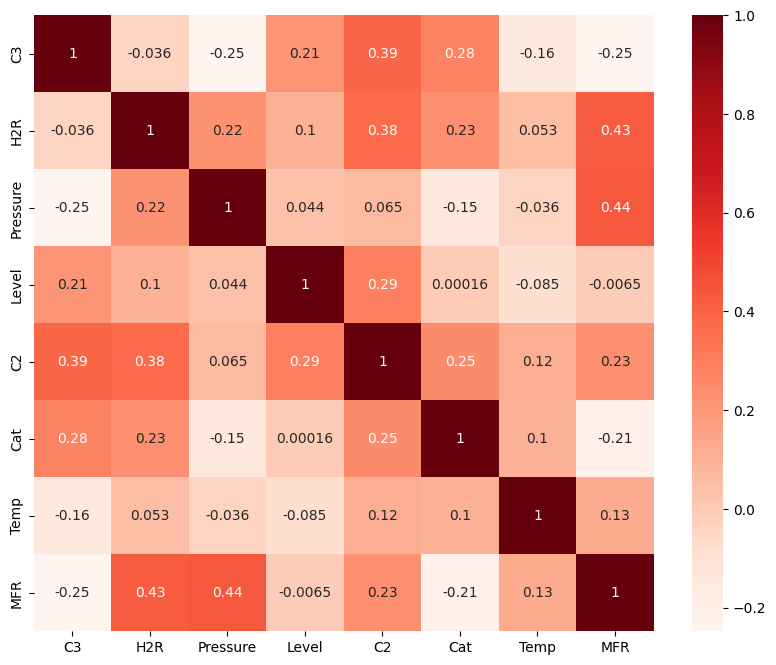

In [22]:
plt.figure(figsize=(10,8))
cor = data.corr()
sns.heatmap(cor, annot=True,cmap=plt.cm.Reds)
plt.show()

## **Question 2** **(20 points)**

**Part 1 (5 points)**
What does correlation mean?

__Answer__:

Refers to a statistical measure that expresses the extent to which two variables are linerly related. That means that when one changes the correlated variable will change in a similar way. In this way correlation quantifies the association btewenn a single pair of variables rather than a larger number of variables and the degree to which a linear relationship exists between two variables.

**Part 2 (10 points)**
What are your observations? Which variables are strongly correlated with `MFR` and which variables are weakly correlated with `MFR`?

__Answer__:

Strongly correlated: Presure and H2R
Weakly correlated: Cat, C3


**Part 3 (5 points)**
Is a variable with a large *negative* correlation useful or not?

__Answer__:

There are some that are negative. However they have an small negative coefficient of correlation. This information is always valuable because a negative correlation means that as one variable increases, the other variable tends to decrease and vice versa.


### Pair Plot

A pair plot shows the correlation between variables.

```python
sns.pairplot(data)
```

It has bar distributions on the diagonal and scatter plots on the off-diagonal. A pair plot also shows a different color (`hue`) by category `w`. Pair plots show correlations between pairs of variables that may be related and gives a good indication of features (explanatory inputs) that are used for classification or regression. Generate your own pair plot of the data.

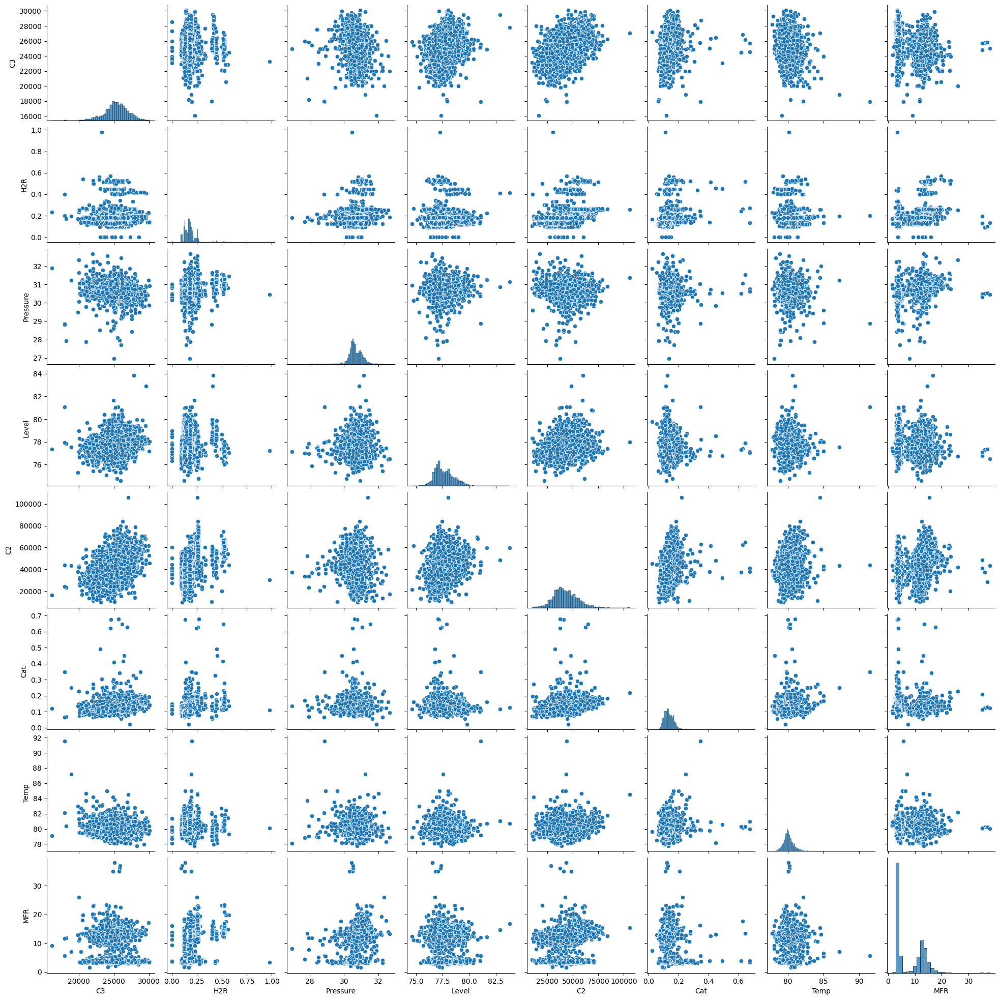

In [23]:
sns.pairplot(data) # This will run for a little bit

### Joint Plot

Want to change the plot style? No problem! 👌

A joint plot shows two variables, with the univariate and joint distributions.

```python
sns.jointplot(x='H2R',y='MFR',data=data,kind="kde")
```

Generate your own joint plot with the data. Try `kind='reg'`, `'kde'`, and `'hex'` to see different joint plot styles.

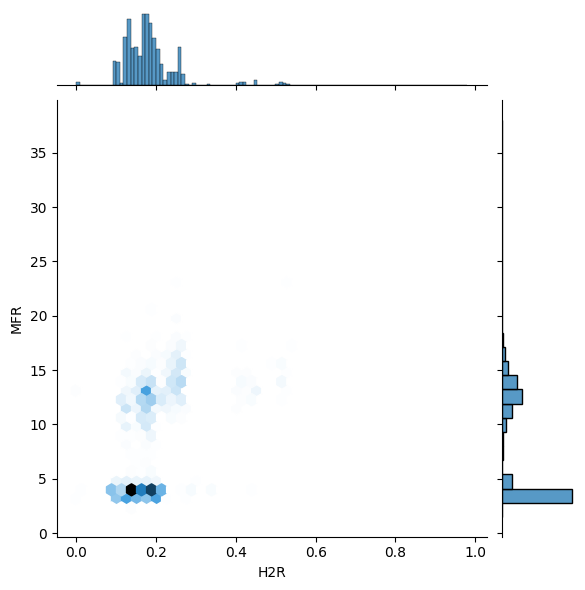

In [24]:
#sns.jointplot(x='H2R',y='MFR',data=data,kind="reg") #scattered plot
#sns.jointplot(x='H2R',y='MFR',data=data,kind="kde")  #contour line plot
sns.jointplot(x='H2R',y='MFR',data=data,kind="hex") #filled contour hexagonal  plot

### Data Analysis with `ydata-profiling` (formerly known as pandas-profiling)

ydata - Profiling is a data analysis tool for a more in-depth summary of the data than the `descibe()` function. [Install the package](https://docs.profiling.ydata.ai/latest/getting-started/installation/) with:

```python
pip install --user ydata-profiling[notebook]
jupyter nbextension enable --py widgetsnbextension
```

<!-- **This idea is important!** You will need to install more packages than Colab provides, and this is an example of doing that.

NOTE:  You need to restart the Kernel before proceeding. The install only needs to run once.  We will talk about this in class. -->

In [25]:
# first need to uninstall a conflicting version of a package,
# then install ydata-profiling
!pip uninstall typing-extensions -y
!pip install -U ydata-profiling[notebook] typing-extensions==4.6.0

# this line allows to use cool interactive widgets with a notebook
# which we will see in action in a few code cells below
!jupyter nbextension enable --py widgetsnbextension


Found existing installation: typing_extensions 4.5.0
Uninstalling typing_extensions-4.5.0:
  Successfully uninstalled typing_extensions-4.5.0
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.8/357.8 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 381.9/381.9 kB 9.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 10.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 11.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.3/293.3 kB 11.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 11.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 22.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 32.2 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of pydantic to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━

In [26]:
from ydata_profiling import ProfileReport

/usr/local/lib/python3.10/dist-packages/numba/core/decorators.py:262: NumbaDeprecationWarning: numba.generated_jit is deprecated. Please see the documentation at: https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-generated-jit for more information and advice on a suitable replacement.
  warnings.warn(msg, NumbaDeprecationWarning)
/usr/local/lib/python3.10/dist-packages/visions/backends/shared/nan_handling.py:51: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def hasna(x: np.ndarray) -> bool:


"Time" breaks the profiling. Remove this column from the data before generating your profile report.

In [27]:
data = data.drop(['Time'], axis=1)

In [28]:
# here we generate the big report
profile = ProfileReport(data, minimal=False)

ProfileReport takes a little time to render the results, please be patient. Next, we can view the report interactively with `profile.to_widgets()`

IMPORTANT NOTE: If you run the following cell and nothing appears, or you get some sort of warning message, try re-running the `profile = ProfileReport(data, minimal=False)` cell again, and then re-run `profile_to_widgets()` cell. The ProfileReport can be a little finicky with Colab.

In [29]:
# This will make nice interface in the notebook
profile.to_widgets()

/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:507: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  warnings.warn(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

View the profile report in the Jupyter Notebook with `profile.to_widgets()`.

## **Question 3** **(10 points)**

Notice that the output of the previous cell is a collection of interactive tabs that contain useful information about our data. Expore the tabs to get familiar with why type of information is present.

Next, find the two most "relevant" variables to `MFR` and fit them with linear regression. Cut and paste their "Interaction" plots here.  Why do you think they are relevant?




Compare the results (r^2 and mse) using these variables with your previous experiments.

__Answer__:


H2R and Presure are the most relevant because the fit the best with linear regression.

Those two variables have the most elevated density of points in a diagonal line that indicates relationship "assocaition" with MFR. A clear trend of hexagons becoming darker or lighter along a certain direction, it would suggest a trend or relationship between H2R and Pressure, among the other varibles

When comparing R^2 and MSE of H2R and Pressure to MFR independently, they do not seem to have a predictable behaviour neither in the R^2 or MSE values.

Pressure
R^2: 0.2019090680741491
mse: 20.775815327202643

H2R
R^2: 0.1856638538044687
mse: 21.19870895763556

However, when they are toguether, they have a lower MSE and a higher R^2. This indicates that both hve an interaction or a complementary relationship. Maybe they are cpmplementary or have an interaction effect menaing that presure and H2R can depent on each other.

Pressure and H2R
R^2: 0.3275641298547487
mse: 17.504776584559064


In [30]:
VAR1='Pressure'
VAR2='H2R'
model = method.fit(
    X=train_dropna[[VAR1, VAR2]].to_numpy(),
    y=train_dropna['MFR'].to_numpy())
r2 = method.score(test_dropna[[VAR1,VAR2]].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[[VAR1,VAR2]].to_numpy()), test_dropna['MFR'].to_numpy())

print('%%%%%%% My variables are: ' + VAR1 + ' and ' +VAR2)
print('R^2: ' + str(r2))
print('mse: ' + str(mse))

%%%%%%% My variables are: Pressure and H2R
R^2: 0.3275641298547487
mse: 17.504776584559064


In [32]:
VAR1='Pressure'
VAR2='H2R'
model = method.fit(
    X=train_dropna[[VAR1]].to_numpy(),
    y=train_dropna['MFR'].to_numpy())
r2 = method.score(test_dropna[[VAR1]].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[[VAR1]].to_numpy()), test_dropna['MFR'].to_numpy())

print('%%%%%%% My variables are: ' + VAR1 )
print('R^2: ' + str(r2))
print('mse: ' + str(mse))

%%%%%%% My variables are: Pressure
R^2: 0.2019090680741491
mse: 20.775815327202643


In [33]:
VAR1='Pressure'
VAR2='H2R'
model = method.fit(
    X=train_dropna[[VAR2]].to_numpy(),
    y=train_dropna['MFR'].to_numpy())
r2 = method.score(test_dropna[[VAR2]].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[[VAR2]].to_numpy()), test_dropna['MFR'].to_numpy())

print('%%%%%%% My variables are: ' + VAR2 )
print('R^2: ' + str(r2))
print('mse: ' + str(mse))

%%%%%%% My variables are: H2R
R^2: 0.1856638538044687
mse: 21.19870895763556


Tired of manually selecting variables? We can use the model to select best features (variables) automatically.

### Select Best Features

We can rank the features to determine the best set that predicts `MFR`.

```python
from sklearn.feature_selection import SelectKBest, f_regression
best = SelectKBest(score_func=f_regression, k='all')
fit = best.fit(x,z)
plt.bar(x=x.columns,height=fit.scores_)
```

There is additional information on [Select K Best Features](https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.SelectKBest.html).

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


<BarContainer object of 7 artists>

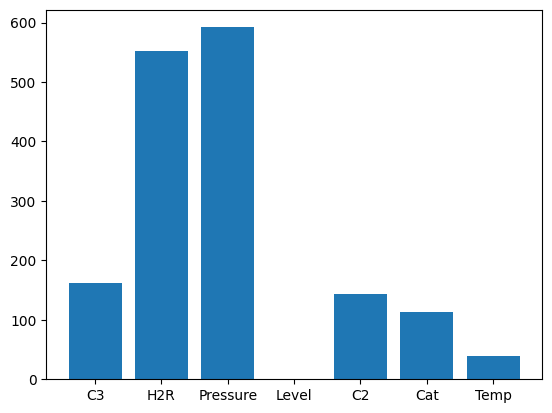

In [34]:
x=data[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']]
z=data[['MFR']]

# These are various feature selection algorithms available
from sklearn.feature_selection import SelectKBest, f_regression
import matplotlib.pylab as plt

# First, instantiate the selection algorithm with the scoring criteria
# here is the documentation on the scoring criteria we selected:
# https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.f_regression.html#sklearn.feature_selection.f_regression
best = SelectKBest(score_func=f_regression, k='all')

# fit the selection algorithm on our data and return
# the f-statistic for each variable; the higher the score,
# the more "significant" the variable is
fit = best.fit(x,z)
plt.bar(x=x.columns,height=fit.scores_)

## **Question 4** **(10 points)**

Based on the above results, select the variables you think are related to `MFR` and fit them with linear regression. Compare the results with the previous experiments.  What do observe?

__Answer__: H2R and Presure are the most relevant because the fit the best with linear regression.


When comparing R^2 and MSE of H2R and Pressure to MFR independently, they do not seem to have a predictable behaviour compare with other variables neither in the R^2 or MSE values.

Pressure
R^2: 0.2019090680741491
mse: 20.775815327202643

H2R
R^2: 0.1856638538044687
mse: 21.19870895763556

However, when they are toguether, they have a lower MSE and a higher R^2. This indicates that both hve an interaction or a complementary relationship. Maybe they are cpmplementary or have an interaction effect menaing that presure and H2R can depent on each other.

Pressure and H2R
R^2: 0.3275641298547487
mse: 17.504776584559064


In [39]:
VAR1='Pressure'
VAR2='H2R'
model = method.fit(
    X=train_dropna[[VAR2]].to_numpy(),
    y=train_dropna['MFR'].to_numpy())
r2 = method.score(test_dropna[[VAR2]].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[[VAR2]].to_numpy()), test_dropna['MFR'].to_numpy())

print('%%%%%%% My variables are: ' + VAR2 )
print('R^2: ' + str(r2))
print('mse: ' + str(mse))

%%%%%%% My variables are: H2R
R^2: 0.1856638538044687
mse: 21.19870895763556


In [41]:
VAR1='Pressure'
VAR2='H2R'
model = method.fit(
    X=train_dropna[[VAR1]].to_numpy(),
    y=train_dropna['MFR'].to_numpy())
r2 = method.score(test_dropna[[VAR1]].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[[VAR1]].to_numpy()), test_dropna['MFR'].to_numpy())

print('%%%%%%% My variables are: ' + VAR1 )
print('R^2: ' + str(r2))
print('mse: ' + str(mse))

%%%%%%% My variables are: Pressure
R^2: 0.2019090680741491
mse: 20.775815327202643


# Solution with Feature Engineering + Data processing

The result of the model is not good enough? Still want to improve the performance further?

Randy 🧙 has a few questions for you. Are there any outliers in the data? Do all variables satisfy the assumptions of the linear model?


There are several graphical techniques to help detect outliers. A box or histogram plot shows outlying points. Make one now and examine it for outliers in each variable.

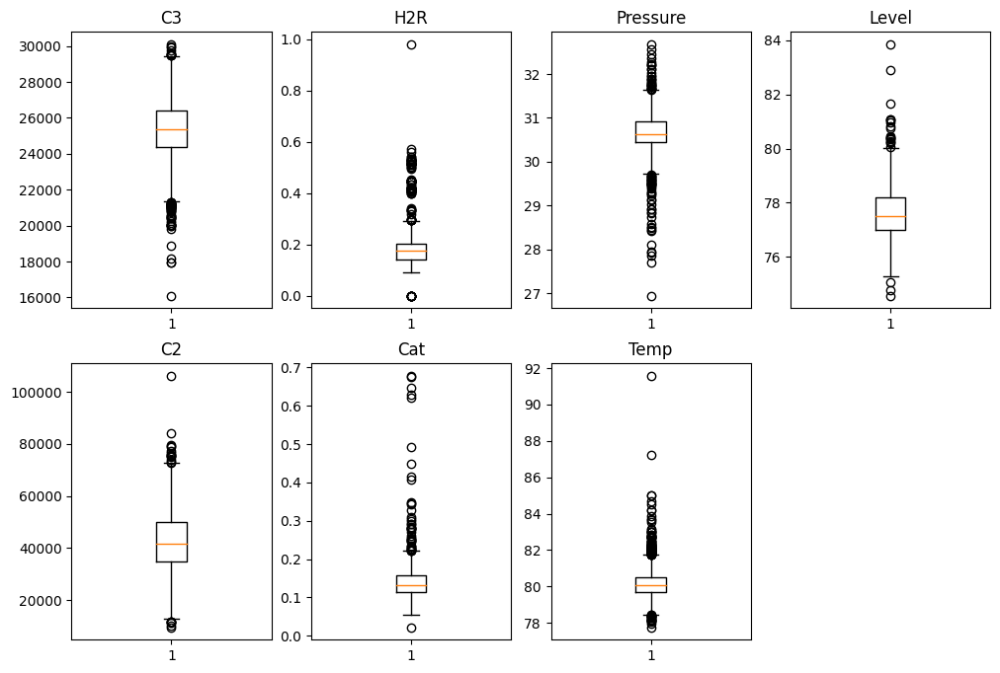

In [35]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(figsize=(12,8))

# iterate over all of the columns
for i,c in enumerate(data.columns):
    if c != "MFR":
        plt.subplot(2,4,i+1)
        plt.title(c)
        plt.boxplot(data[c])
plt.show()

Remove outliers by removing select rows such as with:

```python
data = data[data['H2R']<0.7]
data = data[data['H2R']>0.01]
```

to keep only values of `H2R` (Hydrogen to Monomer ratio) that are between 0.01 and 0.7.

In [36]:
data = data[data['H2R']<0.7]
data = data[data['H2R']>0.01]

Show the boxplot again to verify that the data set does not have the outliers you removed.

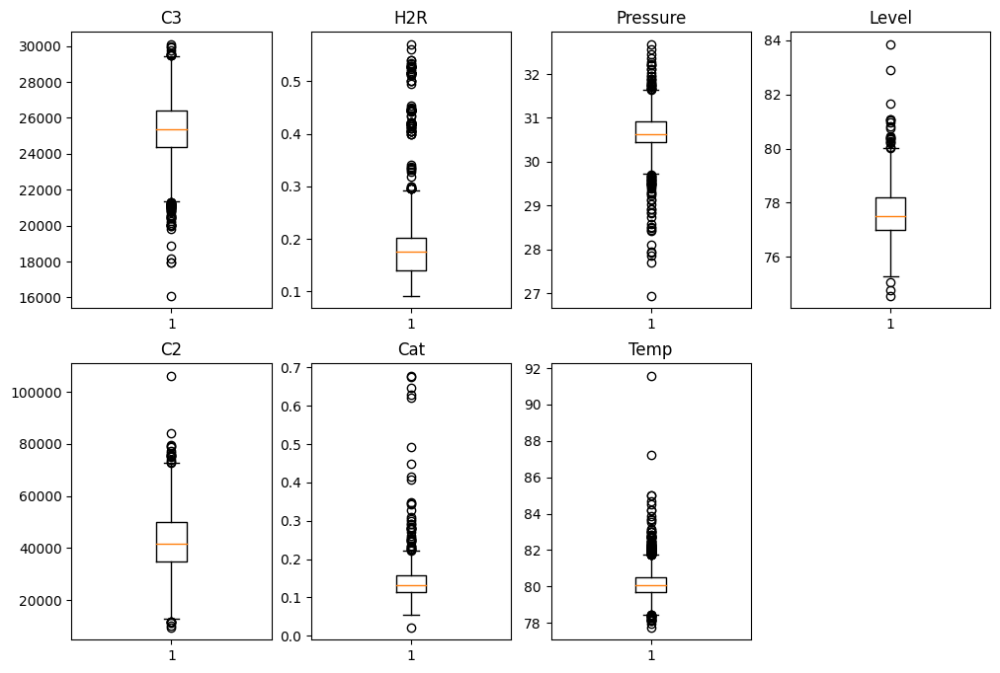

In [37]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(figsize=(12,8))

# iterate over all of the columns
for i,c in enumerate(data.columns):
    if c != "MFR":
        plt.subplot(2,4,i+1)
        plt.title(c)
        plt.boxplot(data[c])
plt.show()

## **Question 5** **(10 points)**

Are there any other outliers in other variables? If so, please remove them.  How did you go about defining outliers?

__Answer__:

 Outliers in a dataset are data points that differ significantly from other observations, due to they lies an abnormal distance from other values in a random sample from a population. They can occur due to variability in the measurement or experimental errors, and sometimes they indicate a true deviation in the data.

 Before removing outliers, it's important to understand their causes, as they might be important indicators or errors that need correcting.

 We decided to use IQR because it is more robust for extreme values due to IQR is based on the median, quatiles and percentlies is less affected by the exptreme outliers that can skew the mean.

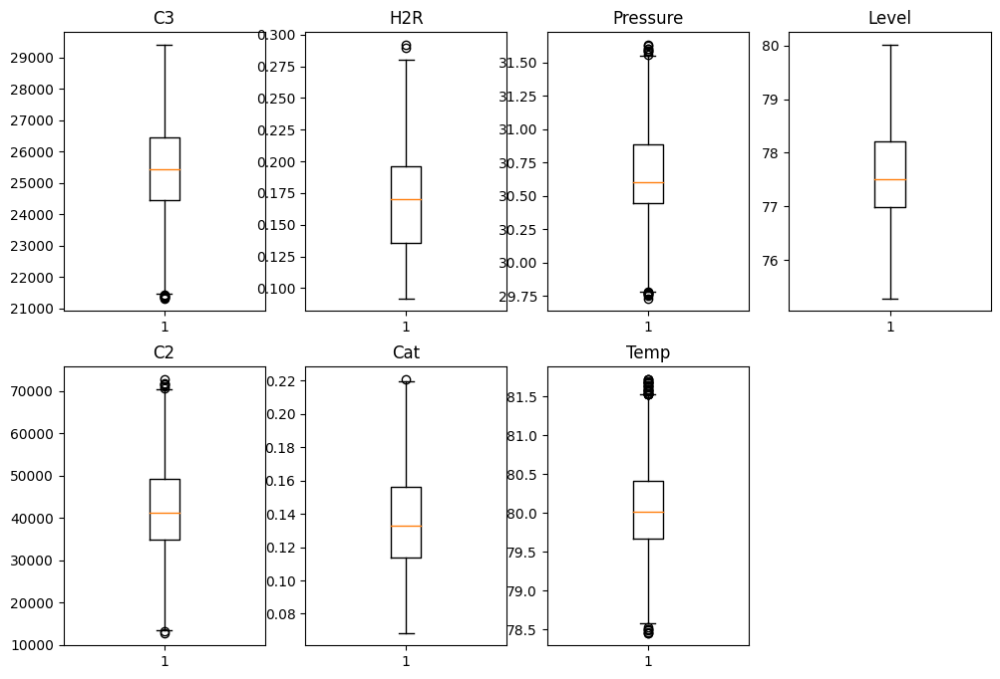

In [38]:
# Provide any code for Question 5 here:
import matplotlib.pyplot as plt
%matplotlib inline

# Method: Outliers are points outside the upper and lower fences in the boxplot
q1=data.quantile(0.25)
q3=data.quantile(0.75)
iqr=q3-q1
n=1.5
qmin=q1-n*iqr
qmax=q3+n*iqr

VARS=['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']
for i in range(len(VARS)):
  data = data[data[VARS[i]]>=qmin[i]]
  data = data[data[VARS[i]]<=qmax[i]]


import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(figsize=(12,8))

# iterate over all of the columns
for i,c in enumerate(data.columns):
    if c != "MFR":
        plt.subplot(2,4,i+1)
        plt.title(c)
        plt.boxplot(data[c])
plt.show()

# Important question!

Who controls the features that you process?  Are you stuck with the features provided by the original experiment?

**NO!!!!**

You have the power!  For example, any invertible transformation of the data can lead to new features or even new targets!   Actually any transformation whatsoever can lead to new features and targets.  Invertible just means that you can always recover your original data :-)

For example, we can apply log transformation to `MFR` and try and predict that instead.  Since the log is invertible, we can just predict that, get an prediction, and then apply the inverse of the log (the exponential map).

Create a new column for the natural log of (`MFR`) as `lnMFR`.

In [42]:
import numpy as np
data['lnMFR'] = np.log(data['MFR'])

Check the results after log transformation

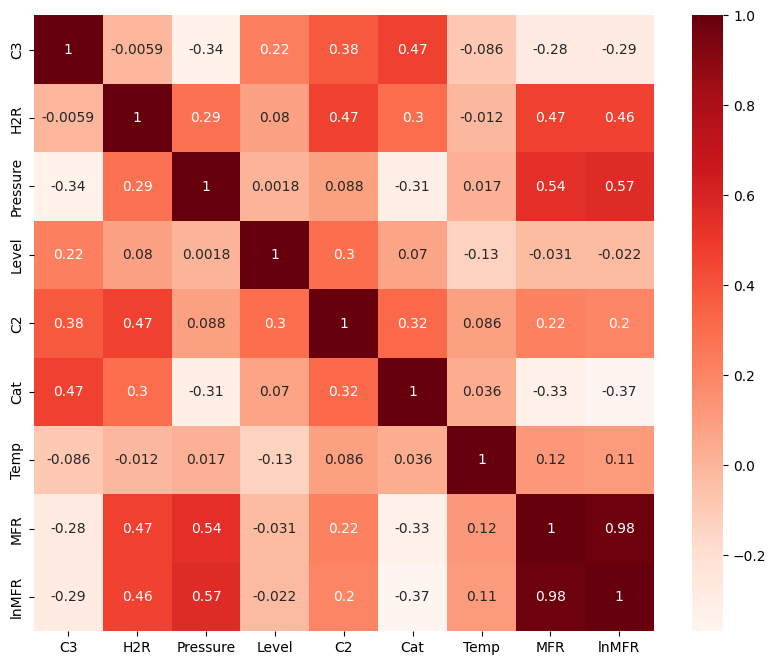

In [43]:
#sns.pairplot(data)

plt.figure(figsize=(10,8))
cor = data.corr()
sns.heatmap(cor, annot=True,cmap=plt.cm.Reds)
plt.show()

## **Question 6** (10 points)

Pick one or two different functions and apply the to `MFR` and see if a transformed `MFR` is easier to predict.  Does transforming `MFR` change what inputs give good predictions?

__Answer__: We picked the exponential `exp(MFR)` and quadratic `MFR^2` functions. We found that the best set of inputs to predict our transformed `MFRs`changed. For `MFR^2` and `ln(MFR)` the best pair of inputs is `H2R` and `Pressure`, but for `exp(MFR)` the best pair is `H2R` and `level`. The behavior of the function influences which inputs give good predictions.


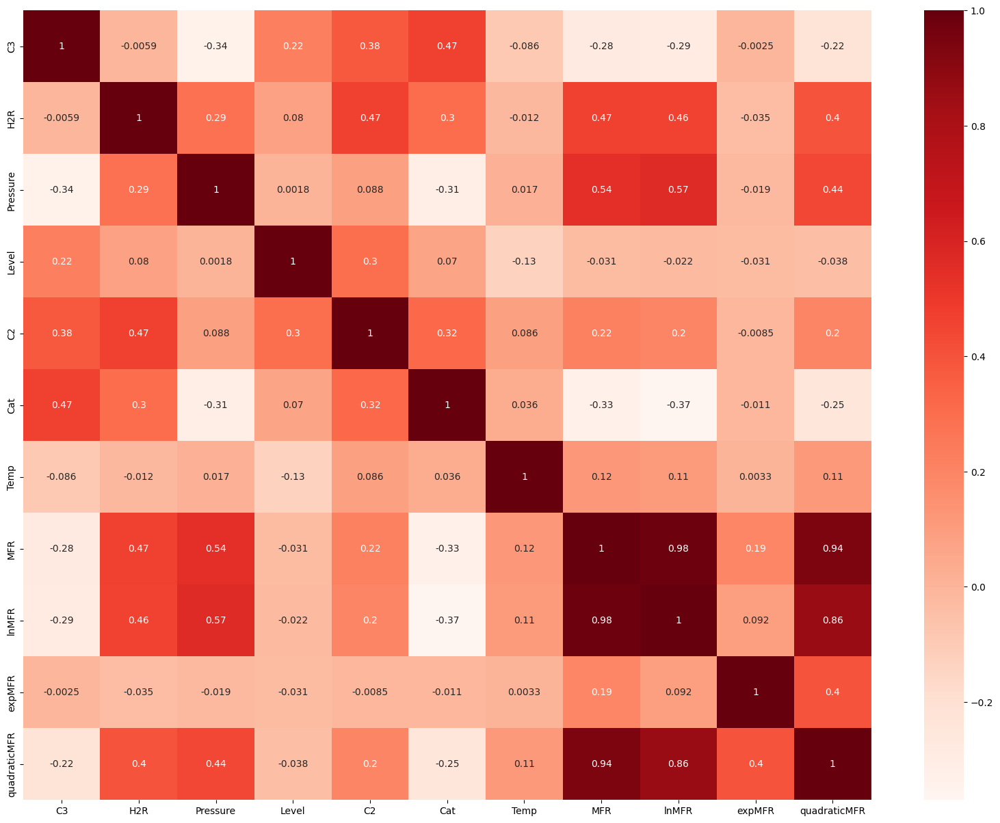

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

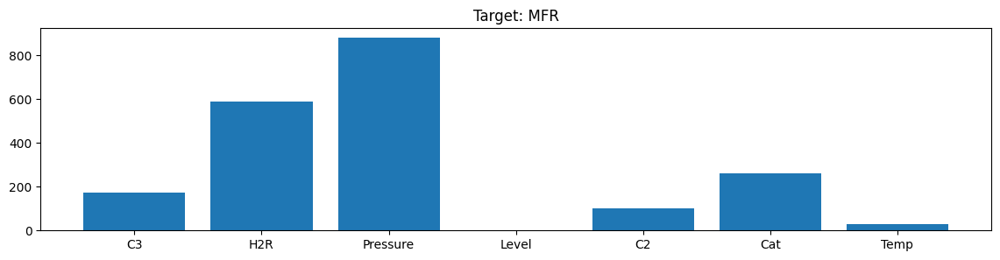

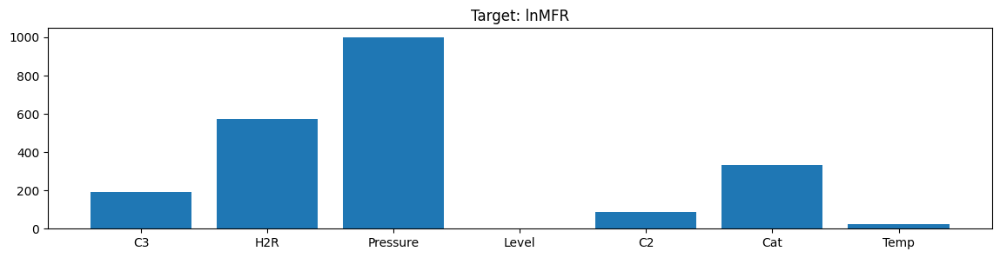

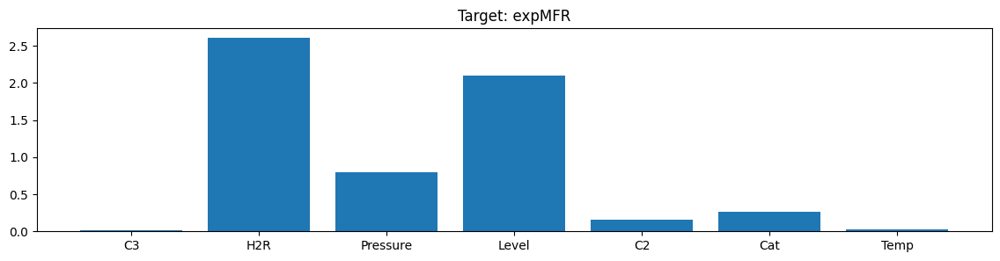

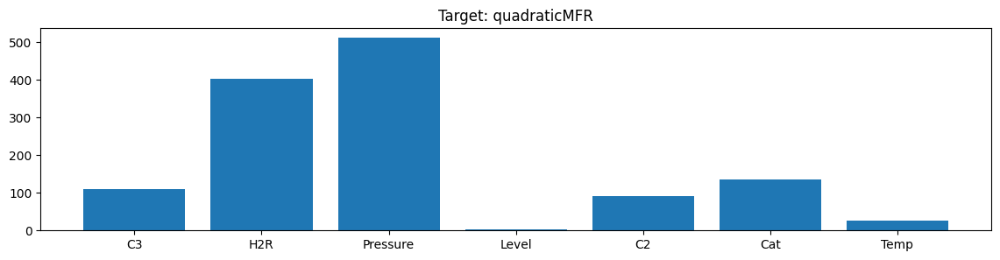

In [44]:
import numpy as np
from sklearn.feature_selection import SelectKBest, f_regression
import matplotlib.pylab as plt

#Transforming MFR
data['lnMFR'] = np.log(data['MFR'])
data['expMFR'] = np.exp(data['MFR'])
data['quadraticMFR'] = data['MFR']*data['MFR']

#Correlation map
plt.figure(figsize=(20,15))
cor = data.corr()
sns.heatmap(cor, annot=True,cmap=plt.cm.Reds)
plt.show()

#Best fit for transformed MFRs
x=data[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']]
TARGET=['MFR', 'lnMFR', 'expMFR','quadraticMFR']

for i in range(len(TARGET)):
  best = SelectKBest(score_func=f_regression, k='all')
  fit = best.fit(x,data[[TARGET[i]]])
  plt.figure(figsize=(14,3))
  plt.bar(x=x.columns,height=fit.scores_)
  plt.title('Target: ' + TARGET[i])

## **Question 7** (10 points)

Just like using transformations on the target (`MFR` in this case), you can use transformations on the inputs. Can you predict a transformed `MFR` from a set of transformed inputs?

Ok, things start to explode now with so many combinations. Just try a few :-)

__Answer__: Yes, a transformed `MFR` can be predicted by a set of transformed inputs. The transformation function should be selected carefully since it leads to better or poorer correlation values.


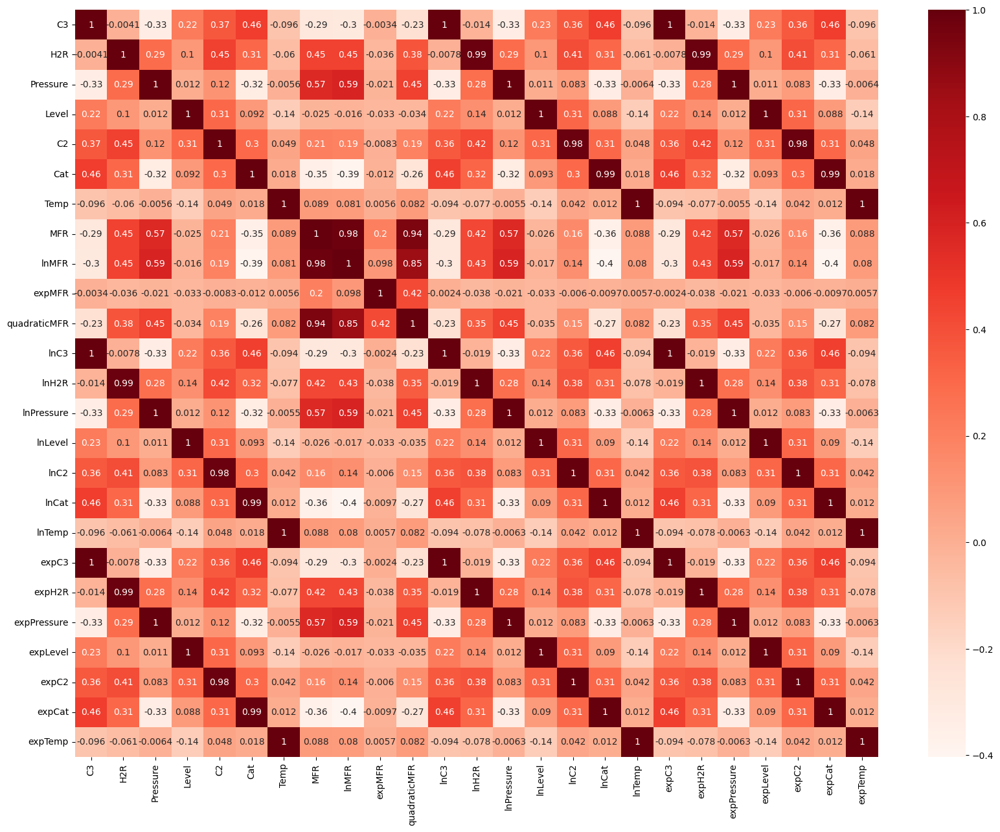

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

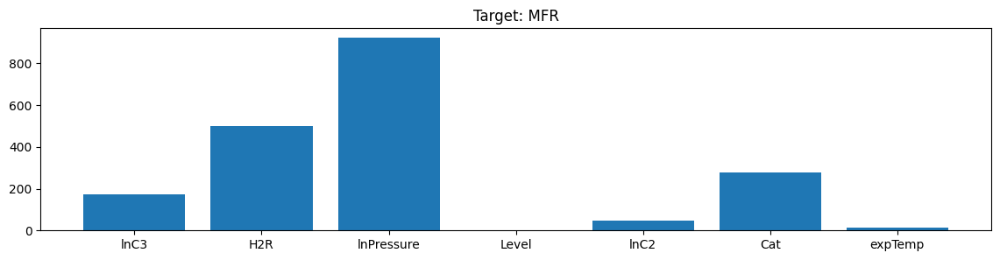

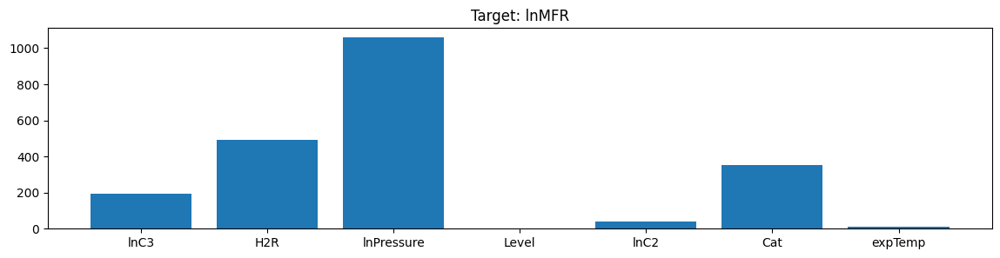

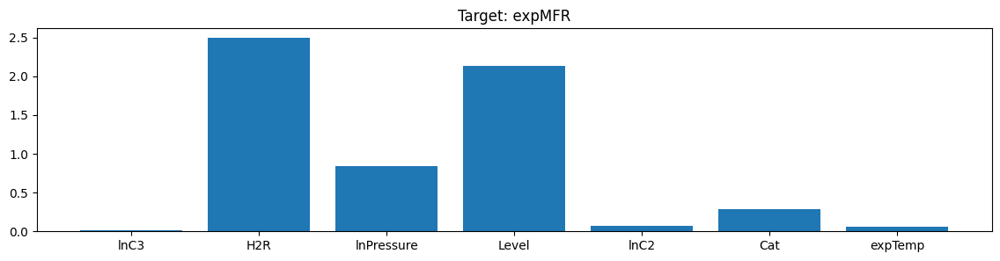

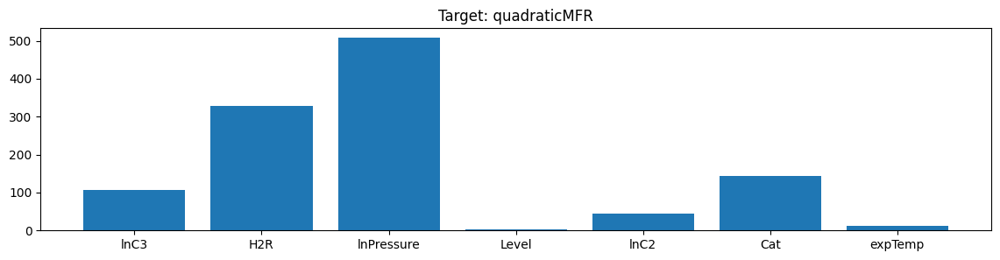

In [ ]:
import numpy as np
from sklearn.feature_selection import SelectKBest, f_regression
import matplotlib.pylab as plt

#Transforming inputs
# ln, exp, quadratic
VARS=['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']

for i in range (len(VARS)):
  newName='ln'+VARS[i]
  data[newName] = np.log(data[VARS[i]])

for i in range (len(VARS)):
  newName='exp'+VARS[i]
  data[newName] = np.log(data[VARS[i]])

#Correlation map
plt.figure(figsize=(20,15))
cor = data.corr()
sns.heatmap(cor, annot=True,cmap=plt.cm.Reds)
plt.show()

#Best fit for transformed MFRs
x=data[['lnC3', 'H2R', 'lnPressure', 'Level', 'lnC2', 'Cat', 'expTemp']]
TARGET=['MFR', 'lnMFR', 'expMFR','quadraticMFR']

for i in range(len(TARGET)):
  best = SelectKBest(score_func=f_regression, k='all')
  fit = best.fit(x,data[[TARGET[i]]])
  plt.figure(figsize=(14,3))
  plt.bar(x=x.columns,height=fit.scores_)
  plt.title('Target: ' + TARGET[i])

### One important transformation:  Scaling the data

Scale data with the `StandardScalar` from `scikit-learn`. This has the effect of making each column have zero mean and have unit variance.

```python
from sklearn.preprocessing import StandardScaler
s = StandardScaler()
ds = s.fit_transform(data)
```

In [ ]:
from sklearn.preprocessing import StandardScaler
# like most methods in sklearn, we first instantiate the algorithm
s = StandardScaler()

# then can use a shortcut function to fit and transform the data of interest
ds = s.fit_transform(data)

The value `ds` is returned as a `numpy` array so we need to convert it back to a `pandas` `DataFrame`.

```python
ds = pd.DataFrame(ds,columns=data.columns)
```

Re-use the column names from `data`.

In [ ]:
ds = pd.DataFrame(ds,columns=data.columns)

Now, we can check the results before/after scaling.

In [ ]:
data.describe()

,C3,H2R,Pressure,Level,C2,Cat,Temp,MFR,lnMFR,expMFR,...,lnC2,lnCat,lnTemp,expC3,expH2R,expPressure,expLevel,expC2,expCat,expTemp
count,1964.000000,1964.000000,1964.000000,1964.000000,1964.000000,1964.000000,1964.000000,1964.000000,1964.000000,1.964000e+03,...,1964.000000,1964.000000,1964.000000,1964.000000,1964.000000,1964.000000,1964.000000,1964.000000,1964.000000,1964.000000
mean,25452.192353,0.169904,30.654263,77.630891,41950.567303,0.135882,80.031453,7.458452,1.806235,2.599712e+13,...,10.613269,-2.017060,4.382396,10.142846,-1.804309,3.422724,4.351905,10.613269,-2.017060,4.382396
std,1482.419636,0.042426,0.298778,0.855683,10138.263875,0.027684,0.553440,4.951150,0.622362,7.734874e+14,...,0.254801,0.206962,0.006913,0.058677,0.254846,0.009730,0.010999,0.254801,0.206962,0.006913
min,21737.680000,0.092000,29.853853,75.332657,15104.282000,0.068525,78.674881,1.700000,0.530628,5.473947e+00,...,9.622734,-2.680550,4.365324,9.986802,-2.385967,3.396314,4.321914,9.622734,-2.680550,4.365324
25%,24510.008500,0.135000,30.446520,76.994654,34724.642500,0.114808,79.669562,3.700000,1.308333,4.044730e+01,...,10.455205,-2.164494,4.377888,10.106837,-2.002480,3.415972,4.343736,10.455205,-2.164494,4.377888
50%,25465.215500,0.169000,30.599579,77.498005,41218.193500,0.133439,80.011985,4.100000,1.410987,6.034029e+01,...,10.626635,-2.014113,4.382176,10.145069,-1.777857,3.420986,4.350252,10.626635,-2.014113,4.382176
75%,26474.475000,0.195000,30.868102,78.201527,48695.122500,0.156253,80.378027,12.300000,2.509599,2.196960e+05,...,10.793334,-1.856279,4.386741,10.183936,-1.634756,3.429723,4.359289,10.793334,-1.856279,4.386741
max,29117.355000,0.276000,31.483952,79.880760,68643.336000,0.214064,81.380615,38.000000,3.637586,3.185593e+16,...,11.136679,-1.541479,4.399137,10.279090,-1.287354,3.449478,4.380535,11.136679,-1.541479,4.399137


In [ ]:
ds.describe()

,C3,H2R,Pressure,Level,C2,Cat,Temp,MFR,lnMFR,expMFR,...,lnC2,lnCat,lnTemp,expC3,expH2R,expPressure,expLevel,expC2,expCat,expTemp
count,1.964000e+03,1.964000e+03,1.964000e+03,1.964000e+03,1.964000e+03,1.964000e+03,1.964000e+03,1.964000e+03,1.964000e+03,1.964000e+03,...,1.964000e+03,1.964000e+03,1.964000e+03,1.964000e+03,1.964000e+03,1.964000e+03,1.964000e+03,1.964000e+03,1.964000e+03,1.964000e+03
mean,-9.551084e-16,-4.341402e-16,-4.594650e-16,-8.277606e-15,3.183695e-16,8.682803e-17,9.551084e-16,-2.025987e-16,1.591847e-16,7.235669e-18,...,-4.833427e-15,-6.077962e-16,4.277728e-14,-3.753865e-14,-8.972230e-16,1.031083e-15,2.425396e-14,-4.833427e-15,-6.077962e-16,4.277728e-14
std,1.000255e+00,1.000255e+00,1.000255e+00,1.000255e+00,1.000255e+00,1.000255e+00,1.000255e+00,1.000255e+00,1.000255e+00,1.000255e+00,...,1.000255e+00,1.000255e+00,1.000255e+00,1.000255e+00,1.000255e+00,1.000255e+00,1.000255e+00,1.000255e+00,1.000255e+00,1.000255e+00
min,-2.506347e+00,-1.836688e+00,-2.679624e+00,-2.686530e+00,-2.648690e+00,-2.433692e+00,-2.451787e+00,-1.163350e+00,-2.050145e+00,-3.361883e-02,...,-3.888481e+00,-3.206664e+00,-2.470012e+00,-2.660022e+00,-2.282974e+00,-2.714951e+00,-2.727517e+00,-3.888481e+00,-3.206664e+00,-2.470012e+00
25%,-6.357335e-01,-8.229038e-01,-6.954846e-01,-7.437320e-01,-7.129194e-01,-7.614376e-01,-6.540605e-01,-7.593003e-01,-8.002247e-01,-3.361883e-02,...,-6.205026e-01,-7.125513e-01,-6.522633e-01,-6.138341e-01,-7.778115e-01,-6.941626e-01,-7.429125e-01,-6.205026e-01,-7.125513e-01,-6.522633e-01
50%,8.787299e-03,-2.130757e-02,-1.830703e-01,-1.553374e-01,-7.225698e-02,-8.828406e-02,-3.518357e-02,-6.784904e-01,-6.352398e-01,-3.361883e-02,...,5.246963e-02,1.424497e-02,-3.174087e-02,3.789267e-02,1.038249e-01,-1.786743e-01,-1.503025e-01,5.246963e-02,1.424497e-02,-3.174087e-02
75%,6.897797e-01,5.916777e-01,7.158971e-01,6.670473e-01,6.654268e-01,7.360260e-01,6.263787e-01,9.781124e-01,1.130441e+00,-3.361883e-02,...,7.068697e-01,7.770600e-01,6.286505e-01,7.004570e-01,6.654877e-01,7.194871e-01,6.715568e-01,7.068697e-01,7.770600e-01,6.286505e-01
max,2.473049e+00,2.501364e+00,2.777648e+00,2.629994e+00,2.633544e+00,2.824831e+00,2.438397e+00,6.170148e+00,2.943332e+00,4.116168e+01,...,2.054718e+00,2.298498e+00,2.422177e+00,2.322506e+00,2.029019e+00,2.750226e+00,2.603740e+00,2.054718e+00,2.298498e+00,2.422177e+00


Note how the mean of each column is practically equal to 0, and the standard deviation is practically equal to 1.



Next, we resplit the processed dataset into training and test set.

**Set a same random_state=1 to ensure the splitting of data in this step is the same as the splitting of data in the step earlier in the notebook.**

NOTE:  We will come back to this important point later 🧙

In [ ]:
from sklearn.model_selection import train_test_split
train_processed,test_processed = train_test_split(ds, test_size=0.2, shuffle=True, random_state=1)

## **Question 8** (10 points)

Using the trained data to train the linear regression model, and report the results. Do models perform better? Why?

__Answer__: We observed that `mse` values are now lower than the ones showed in question 1. The standard scaling caused a change in the range of the dataset such that the mean value moved to zero and standard deviation changed to one. This reduction in `mse` is not a metric to conclude a better model performance after the scaling.

The standard scaling is equalizing the contribution of each input, similar to what a nondimensionalization does. Now we have the more accurate metrics to analyze the model performance. We also observed that `R^2` increased except for `level & C2`, `C2 - temp` and `temp-level` where we see a reduction. The highest `R^2` value was for the `H2R & Pressure` inputs, supporting the hypothesis that they can be used to predict `MFR`.

Hint:
```python
method = linear_model.LinearRegression()

model = method.fit(train_processed[['variable 1','variable 2']].to_numpy(),train_processed['MFR'].to_numpy())

r2 = method.score(test_processed[['variable 1','variable 2']].to_numpy(),test_processed['MFR'].to_numpy())

mse = mean_squared_error(method.predict(test_processed[['variable 1','variable 2']].to_numpy()), test_processed['MFR'].to_numpy())

print('R^2: ' + str(r2))

print('mse: ' + str(mse))
```

In [ ]:
#
method = linear_model.LinearRegression()
VARS=['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']
for i in range(len(VARS)):
  for j in range(len(VARS)):
    if i!=j:
      VAR1=VARS[i]
      VAR2=VARS[j]
      model = method.fit(
          X=train_processed[[VAR1, VAR2]].to_numpy(),
          y=train_processed['MFR'].to_numpy())
      r2 = method.score(test_processed[[VAR1,VAR2]].to_numpy(),test_processed['MFR'].to_numpy())
      mse = mean_squared_error(method.predict(test_processed[[VAR1,VAR2]].to_numpy()), test_processed['MFR'].to_numpy())

      print('%%%%%%% My variables are: ' + VAR1 + ' and ' +VAR2)
      print('R^2: ' + str(r2))
      print('mse: ' + str(mse))
      print(' ')


%%%%%%% My variables are: C3 and H2R
R^2: 0.36705455028591905
mse: 0.5737457666380715
 
%%%%%%% My variables are: C3 and Pressure
R^2: 0.38748990728069543
mse: 0.555221738112727
 
%%%%%%% My variables are: C3 and Level
R^2: 0.11970064846854667
mse: 0.7979645426688258
 
%%%%%%% My variables are: C3 and C2
R^2: 0.24406134617895603
mse: 0.6852353590089453
 
%%%%%%% My variables are: C3 and Cat
R^2: 0.15044572676780277
mse: 0.7700950658803875
 
%%%%%%% My variables are: C3 and Temp
R^2: 0.12699160886309335
mse: 0.7913555092000069
 
%%%%%%% My variables are: H2R and C3
R^2: 0.36705455028591893
mse: 0.5737457666380715
 
%%%%%%% My variables are: H2R and Pressure
R^2: 0.48809688982069144
mse: 0.464024573566196
 
%%%%%%% My variables are: H2R and Level
R^2: 0.2555998245774186
mse: 0.6747760798758806
 
%%%%%%% My variables are: H2R and C2
R^2: 0.24661276052826542
mse: 0.6829225796335392
 
%%%%%%% My variables are: H2R and Cat
R^2: 0.5199957444781971
mse: 0.4351092336603408
 
%%%%%%% My variable

# More advanced solution

Want to learn more? Let's look at a more advanced solution.

![?](https://i.imgflip.com/2l2aus.jpg)

Let's try a count plot to show the number of binned samples of `lnMFR`.

<Axes: xlabel='lnMFR', ylabel='count'>

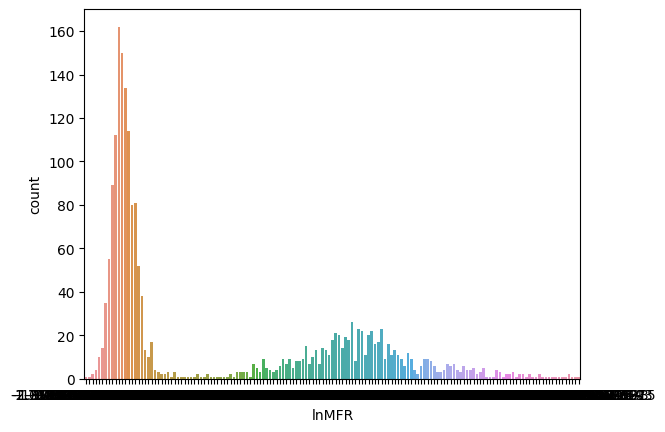

In [ ]:
sns.countplot(x=ds['lnMFR'])

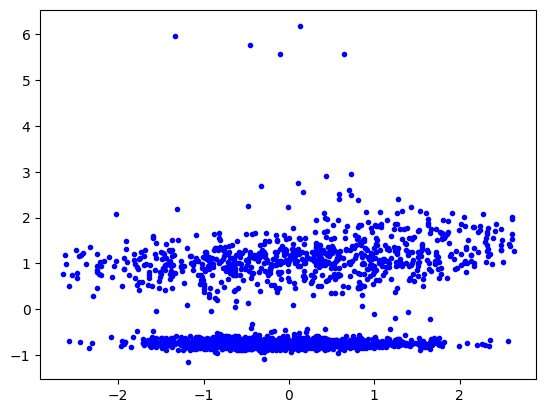

In [ ]:
plt.plot(ds['C2'], ds['MFR'],'b.')

Note the interesting distribution of the data- it has a multimodal Gaussian distribution, in this case with two peaks.

Why not split the data into two parts, one for each Gaussian, then perform regression on each part separately? Will this regression perform better than a single regression algorithm for the full dataset?

First we split the data into two parts, then make train/test splits of each part with

In [ ]:
from sklearn.model_selection import train_test_split
lower_data = ds[ds['lnMFR']<0]
upper_data = ds[ds['lnMFR']>0]
lower_train,lower_test = train_test_split(lower_data, test_size=0.2, shuffle=True,random_state=1)
upper_train,upper_test = train_test_split(upper_data, test_size=0.2, shuffle=True,random_state=1)

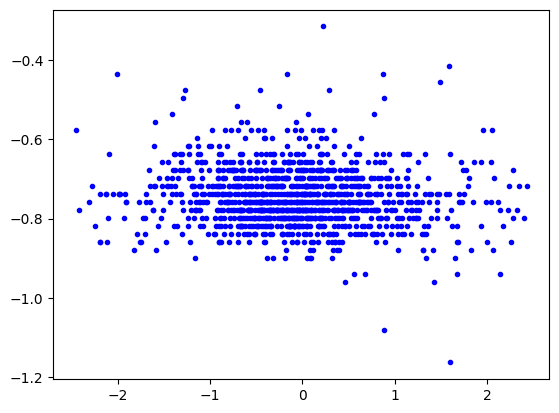

In [ ]:
plt.plot(lower_data['Temp'], lower_data['MFR'],'b.')

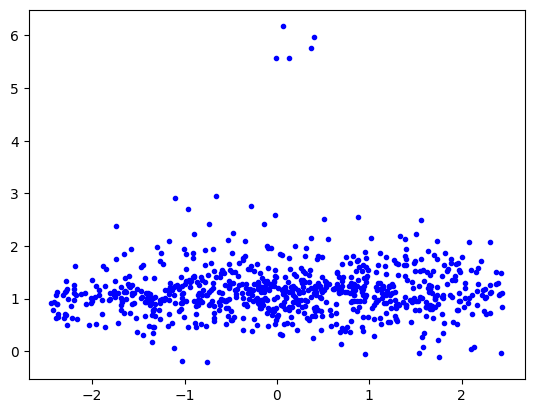

In [ ]:
plt.plot(upper_data['Temp'], upper_data['MFR'],'b.')

Run the following code to test linear regression on the full data set as well as the subsets.

In [ ]:
def fits(data):
    X = ['Temp']
    y = ['MFR']
    # change this if you applied log transformation to your selected variables.
    method = linear_model.LinearRegression()

    model = method.fit(data[X].to_numpy(), data[y].to_numpy())

    MFR_pred = method.predict(data[X].to_numpy())
    r2_model = method.score(data[X].to_numpy(),data['lnMFR'].to_numpy())
    mse_model = mean_squared_error(method.predict(data[X].to_numpy()), data['lnMFR'].to_numpy())

    print('R^2: ' + str(r2_model))
    print('mse: ' + str(mse_model))

    plt.plot(data[X[0]], data[y],'b.', label="Real Data")
    plt.plot(data[X[0]], MFR_pred,'r.', label="Predictions")
    plt.legend()


    return

R^2: -82.90637533257573
mse: 32.483250430571296


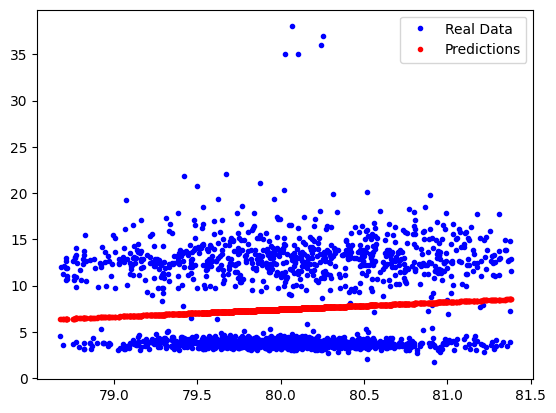

In [ ]:
fits(data)

R^2: -0.040604237340785776
mse: 0.02632976910025388


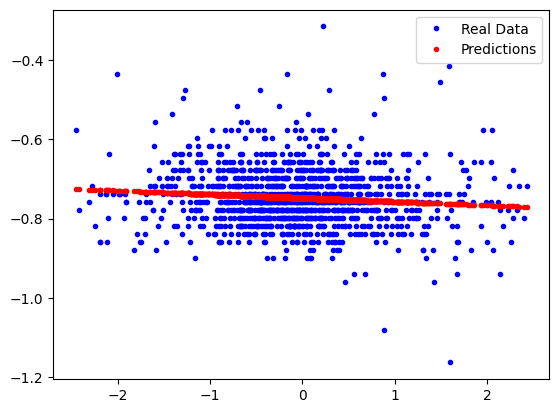

In [ ]:
fits(lower_data)

R^2: -0.03244004684715662
mse: 0.09319074671878996


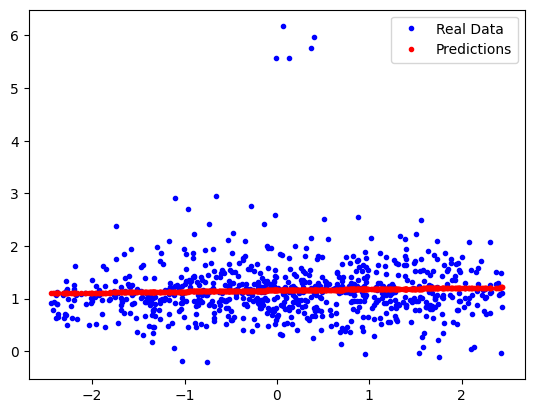

In [ ]:
fits(upper_data)

## **Question 9** (10 points)

Explain what is going on here?  Was it ever a good idea to use linear regression on the whole dataset!?  In particular, what does it mean that the R^2 and mse changed so much?

__Answer__: The plots above elucidate the existance of two different subpopulations in the dataset. The big changes in `R^2` and `mse` shows that the predictability of each subpopulation is different. If we study each subgroup separetly, we would probably see better model performances for the upper group.

## **Question 10** **($\infty$ points, since this is where you really learn stuff! :-)**

You can get as many points of extra credit as you like by doing a good job with this question!

Play around with doing a better analysis.  Things to try:

1.   Redo the calculations, but start from the split dataset above.
2.   Try different train and test splits and see if the answer changes (i.e.,
```
train_processed,test_processed = train_test_split(ds, test_size=0.2, shuffle=True, random_state=1234)
```
3.   Try different methods such as `linear_model.LinearRegression()`, `KNeighborsRegressor(n_neighbors=20)`, `linear_model.Ridge()`, `linear_model.Lasso()`, or `linear_model.BayesianRidge()`. Can you achieve better performance than any of the previous models?

4.  Answer the following question carefully:  What is the problem with using this method of selecting a model based on its performance on testing data?


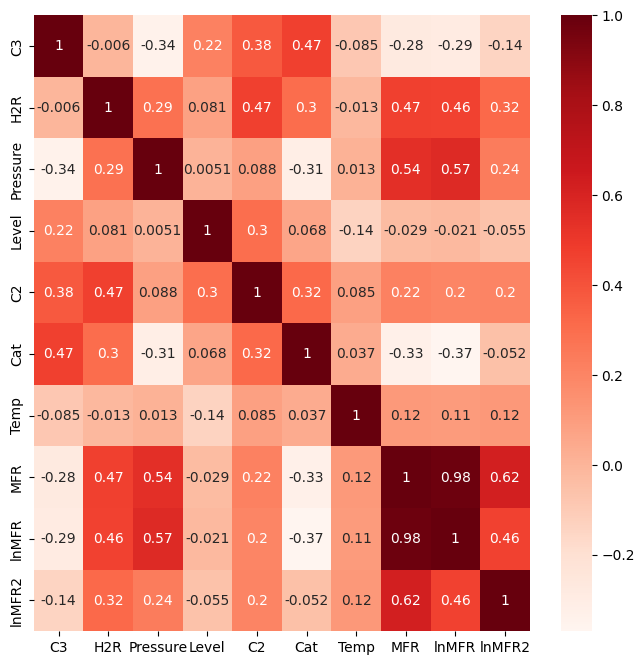

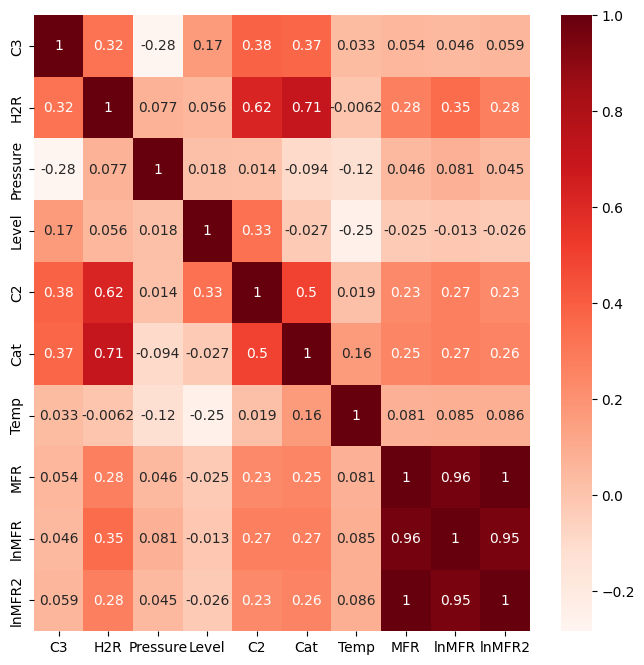

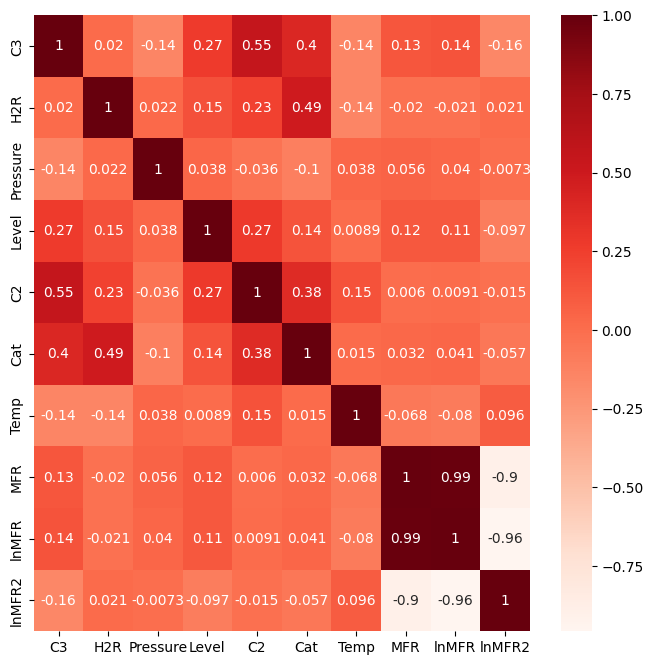

LinearRegression()
All data
R^2: 0.5068792582513044
mse: 0.47715405875455624
 
LinearRegression()
Lower data
R^2: -0.005315610209275734
mse: 0.029850149090886336
 
LinearRegression()
Upper data
R^2: 0.13515163641579608
mse: 0.08583308178896147
 


In [ ]:
import pandas as pd
from sklearn import linear_model
from sklearn.neighbors import KNeighborsRegressor
import numpy as np
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, f_regression
import matplotlib.pyplot as plt

# Read data
url = 'https://raw.githubusercontent.com/rcpaffenroth/DS595-Machine-Learning-for-Engineering-and-Science-Applications/main/data/polymer_reactor.txt'
data = pd.read_csv(url)
data = data.set_axis(['Time','C3','H2R','Pressure','Level','C2','Cat','Temp','MFR'], axis=1)

# Drop NaNs
data = data.dropna()
# Drop Time column
data = data.drop(['Time'], axis=1)

# Calculate the modified target lnMFR
data['lnMFR'] = np.log(data['MFR'])

# Standard Scaling
s = StandardScaler()
ds = s.fit_transform(data)
ds = pd.DataFrame(ds,columns=data.columns)

ds['lnMFR2'] = (ds['lnMFR'])**2

# Remove outliers: Outliers are points outside the upper and lower fences in the boxplot
q1=ds.quantile(0.25)
q3=ds.quantile(0.75)
iqr=q3-q1
n=1.5
qmin=q1-n*iqr
qmax=q3+n*iqr

VARS=['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']
for i in range(len(VARS)):
  ds = ds[ds[VARS[i]]>=qmin[i]]
  ds = ds[ds[VARS[i]]<=qmax[i]]


#import matplotlib.pyplot as plt
#%matplotlib inline
#plt.figure(figsize=(12,8))

# iterate over all of the columns
#for i,c in enumerate(ds.columns):
#    if c != "MFR":
#        plt.subplot(2,4,i+1)
#        plt.title(c)
#        plt.boxplot(ds[c])
#plt.show()

# All population and divide into two subpopulations
all_data   = ds
lower_data = ds[ds['lnMFR']<0.0]
upper_data = ds[ds['lnMFR']>0.0]

#Correlation map
plt.figure(figsize=(8,8))
cor = all_data.corr()
sns.heatmap(cor, annot=True,cmap=plt.cm.Reds)
plt.show()

plt.figure(figsize=(8,8))
cor = upper_data.corr()
sns.heatmap(cor, annot=True,cmap=plt.cm.Reds)
plt.show()

plt.figure(figsize=(8,8))
cor = lower_data.corr()
sns.heatmap(cor, annot=True,cmap=plt.cm.Reds)
plt.show()

# Train and test splits
all_train,all_test = train_test_split(all_data, test_size=0.2, shuffle=True,random_state=1)
lower_train,lower_test = train_test_split(lower_data, test_size=0.2, shuffle=True,random_state=1)
upper_train,upper_test = train_test_split(upper_data, test_size=0.2, shuffle=True,random_state=1)

# Select the method
method = [linear_model.LinearRegression()]
#method = [linear_model.LinearRegression(), KNeighborsRegressor(n_neighbors=20), linear_model.Ridge(), linear_model.Lasso(), linear_model.BayesianRidge()]

def PerfMeth(mthd, train, test, textPrint):
  A=['Pressure','H2R']
  B='lnMFR'
  model = mthd.fit(
      X=train[A].to_numpy(),
      y=train[B].to_numpy())

  # Performance indicators
  r2 = mthd.score(test[A].to_numpy(),test[B].to_numpy())
  mse = mean_squared_error(mthd.predict(test[A].to_numpy()), test[B].to_numpy())
  print(mthd)
  print(textPrint)
  print('R^2: ' + str(r2))
  print('mse: ' + str(mse))
  print(" ")


for i in range(len(method)):
  PerfMeth(method[i], all_train, all_test, "All data")
  PerfMeth(method[i], lower_train, lower_test, "Lower data")
  PerfMeth(method[i], upper_train, upper_test, "Upper data")



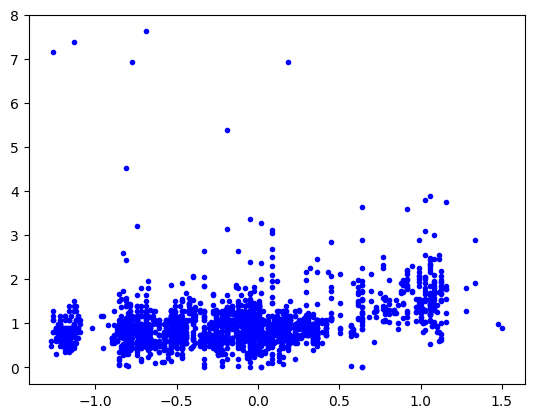

In [ ]:
#import seaborn as sns
#sns.pairplot(upper_data) # This will run for a little bit
#plt.plot(upper_data['H2R'], upper_data['MFR'],'b.')
#plt.plot(lower_data['H2R'], lower_data['MFR'],'b.')
plt.plot(all_data['H2R'], all_data['lnMFR2'],'b.')